In [1]:
import pandas as pd
import numpy as np
import os

C:\Users\benfi\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.0' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
C:\Users\benfi\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:62: UserWarning: Pandas requires version '1.3.4' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


In [2]:
# Define the file path
file_path = 'C:\\Users\\benfi\\Defensive_Players_NFL\\data\\complete_drafted_df.csv'

# Read the CSV file into a DataFrame
complete_drafted_df = pd.read_csv(file_path)

# Display the first few rows of the DataFrame
complete_drafted_df

,URL,School,Conf,G,college_solo_tackles,college_assisted_tackle,college_total_tackles,college_tackles_for_loss,college_sk,college_int,...,college_int_yds_avg,college_int_td_avg,college_passes_defended_avg,college_fumbles_recov_avg,college_fumbles_recov_yds_avg,college_fumbles_recov_td_avg,college_fumbles_forced_avg,drafted,position_group,power_5
0,https://www.sports-reference.com/cfb/players/a...,Iowa State,Big 12,24.0,42.0,34.0,76.0,8.0,2.5,0.0,...,0.000000,0.000000,0.041667,0.000000,0.000000,0.000000,0.041667,True,DL,True
1,https://www.sports-reference.com/cfb/players/a...,Iowa State,Big 12,24.0,162.0,92.0,254.0,17.5,3.0,2.0,...,0.916667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,True,LB,True
2,https://www.sports-reference.com/cfb/players/a...,Florida State,ACC,36.0,34.0,41.0,75.0,17.5,5.5,0.0,...,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,True,DL,True
3,https://www.sports-reference.com/cfb/players/a...,Cincinnati,Big East,34.0,43.0,35.0,78.0,17.0,7.0,0.0,...,0.000000,0.000000,0.117647,0.058824,1.088235,0.029412,0.000000,True,LB,False
4,https://www.sports-reference.com/cfb/players/a...,Arizona,Pac-10,46.0,143.0,40.0,183.0,8.5,1.0,15.0,...,7.586957,0.065217,0.000000,0.000000,0.000000,0.000000,0.000000,True,DB,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1955,https://www.sports-reference.com/cfb/players/t...,UTEP,CUSA,45.0,217.0,174.0,391.0,35.0,8.5,2.0,...,-0.044444,0.000000,0.333333,0.088889,0.444444,0.022222,0.111111,True,LB,False
1956,https://www.sports-reference.com/cfb/players/t...,Florida,SEC,51.0,135.0,79.0,214.0,32.0,9.5,1.0,...,0.294118,0.000000,0.176471,0.000000,0.000000,0.000000,0.039216,True,LB,True
1957,https://www.sports-reference.com/cfb/players/x...,Clemson,ACC,61.0,65.0,56.0,121.0,35.0,17.5,0.0,...,0.000000,0.114754,0.032787,0.327869,0.000000,0.098361,0.000000,True,DL,True
1958,https://www.sports-reference.com/cfb/players/z...,Georgia,SEC,50.0,28.0,24.0,52.0,5.0,1.5,0.0,...,0.000000,0.080000,0.020000,0.000000,0.000000,0.020000,0.000000,True,DL,True


In [3]:
############# modelling starts here

In [4]:
%%javascript
Jupyter.OutputArea.prototype._should_scroll = function() {
    return false;
}

<IPython.core.display.Javascript object>

In [5]:
####draft piuck correlation

In [6]:
#college stats

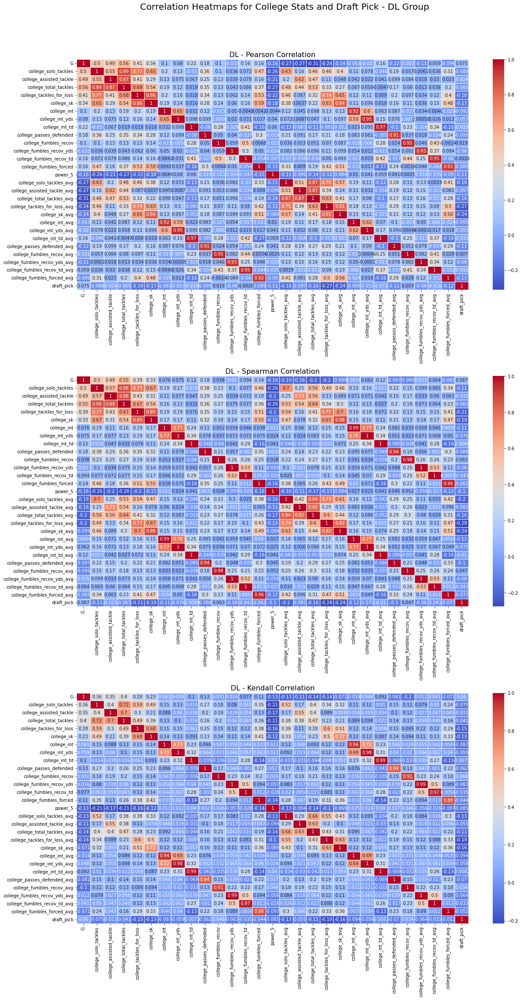

In [7]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Select relevant college stat features for correlation analysis with draft_pick
college_stat_columns_with_draft_pick = [
    'G', 'college_solo_tackles', 'college_assisted_tackle', 'college_total_tackles',
    'college_tackles_for_loss', 'college_sk', 'college_int', 'college_int_yds',
    'college_int_td', 'college_passes_defended', 'college_fumbles_recov', 
    'college_fumbles_recov_yds', 'college_fumbles_recov_td', 'college_fumbles_forced', 
    'power_5', 'college_solo_tackles_avg',
       'college_assisted_tackle_avg', 'college_total_tackles_avg',
       'college_tackles_for_loss_avg', 'college_sk_avg', 'college_int_avg',
       'college_int_yds_avg', 'college_int_td_avg',
       'college_passes_defended_avg', 'college_fumbles_recov_avg',
       'college_fumbles_recov_yds_avg', 'college_fumbles_recov_td_avg',
       'college_fumbles_forced_avg', 'draft_pick'  # Add draft_pick for correlation analysis
]

# Function to create heatmaps for all correlation methods for the DL position group
def plot_college_stats_correlation_dl_methods():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    fig, axes = plt.subplots(3, 1, figsize=(18, 32))  # Create a 3x1 grid of subplots (one below the other)
    fig.suptitle('Correlation Heatmaps for College Stats and Draft Pick - DL Group', fontsize=20)
    
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == 'DL']
    
    for i, method in enumerate(methods):
        correlation_matrix = group_data[college_stat_columns_with_draft_pick].corr(method=method)
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=axes[i])
        axes[i].set_title(f'DL - {method.capitalize()} Correlation', fontsize=16)
        

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to plot all correlation methods for the DL position group
plot_college_stats_correlation_dl_methods()



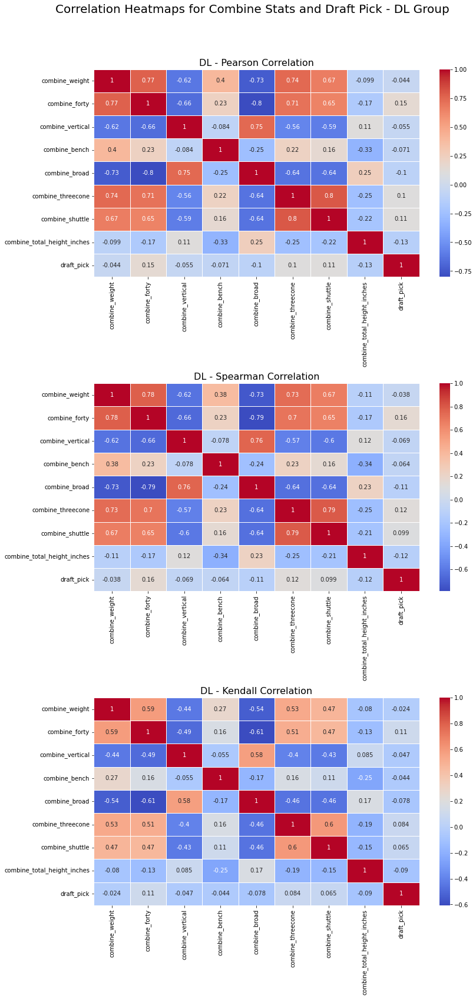

In [8]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Select relevant combine stat features for correlation analysis with draft_pick
combine_stat_columns_with_draft_pick = [
    'combine_weight', 'combine_forty', 'combine_vertical', 'combine_bench', 
    'combine_broad', 'combine_threecone', 'combine_shuttle', 'combine_total_height_inches', 
    'draft_pick'  # Add draft_pick for correlation analysis
]

# Function to create heatmaps for all correlation methods for the DL position group (combine stats)
def plot_combine_stats_correlation_dl_methods():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    fig, axes = plt.subplots(3, 1, figsize=(12, 24))  # Create a 3x1 grid of subplots
    fig.suptitle('Correlation Heatmaps for Combine Stats and Draft Pick - DL Group', fontsize=20)
    
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == 'DL']
    
    for i, method in enumerate(methods):
        correlation_matrix = group_data[combine_stat_columns_with_draft_pick].corr(method=method)
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=axes[i])
        axes[i].set_title(f'DL - {method.capitalize()} Correlation', fontsize=16)
        

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to plot all correlation methods for the DL position group
plot_combine_stats_correlation_dl_methods()


In [9]:
#LB

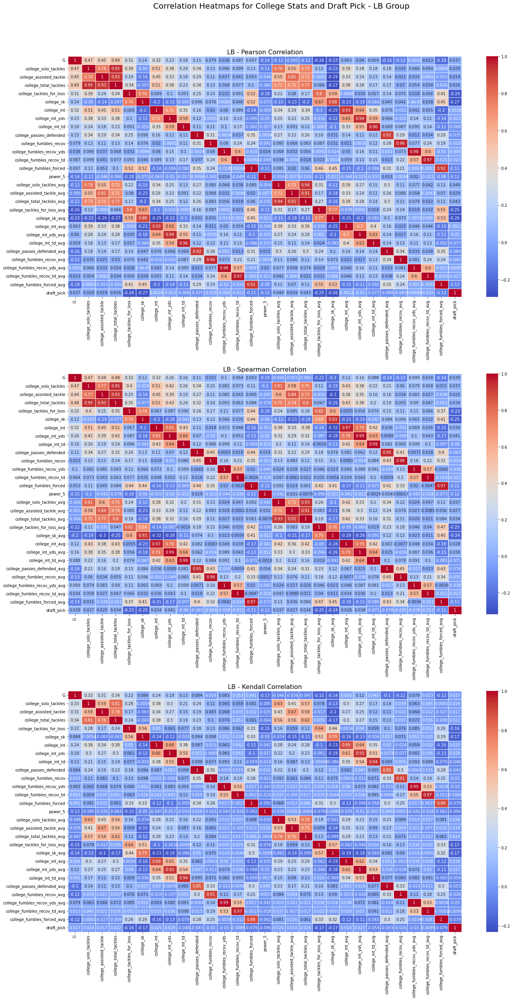

In [10]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Select relevant college stat features for correlation analysis with draft_pick
college_stat_columns_with_draft_pick = [
    'G', 'college_solo_tackles', 'college_assisted_tackle', 'college_total_tackles',
    'college_tackles_for_loss', 'college_sk', 'college_int', 'college_int_yds',
    'college_int_td', 'college_passes_defended', 'college_fumbles_recov', 
    'college_fumbles_recov_yds', 'college_fumbles_recov_td', 'college_fumbles_forced', 
    'power_5', 'college_solo_tackles_avg',
       'college_assisted_tackle_avg', 'college_total_tackles_avg',
       'college_tackles_for_loss_avg', 'college_sk_avg', 'college_int_avg',
       'college_int_yds_avg', 'college_int_td_avg',
       'college_passes_defended_avg', 'college_fumbles_recov_avg',
       'college_fumbles_recov_yds_avg', 'college_fumbles_recov_td_avg',
       'college_fumbles_forced_avg', 'draft_pick'  # Add draft_pick for correlation analysis
]
# Function to create heatmaps for all correlation methods for the LB position group
def plot_college_stats_correlation_lb_methods():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    fig, axes = plt.subplots(3, 1, figsize=(20, 36))  # Create a 3x1 grid of subplots (one below the other)
    fig.suptitle('Correlation Heatmaps for College Stats and Draft Pick - LB Group', fontsize=20)
    
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == 'LB']
    
    for i, method in enumerate(methods):
        correlation_matrix = group_data[college_stat_columns_with_draft_pick].corr(method=method)
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=axes[i])
        axes[i].set_title(f'LB - {method.capitalize()} Correlation', fontsize=16)
        

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to plot all correlation methods for the LB position group
plot_college_stats_correlation_lb_methods()



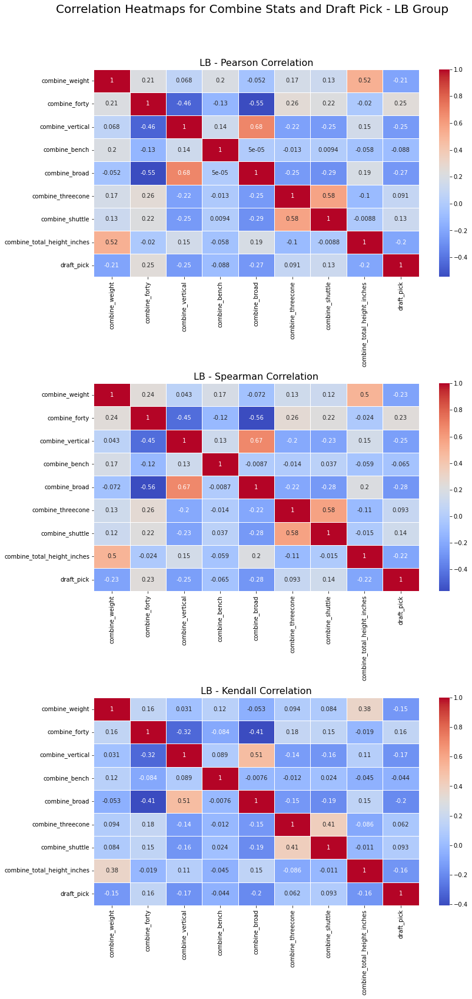

In [11]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Select relevant combine stat features for correlation analysis with draft_pick
combine_stat_columns_with_draft_pick = [
    'combine_weight', 'combine_forty', 'combine_vertical', 'combine_bench', 
    'combine_broad', 'combine_threecone', 'combine_shuttle', 'combine_total_height_inches', 
    'draft_pick'  # Add draft_pick for correlation analysis
]

# Function to create heatmaps for all correlation methods for the LB position group (combine stats)
def plot_combine_stats_correlation_lb_methods():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    fig, axes = plt.subplots(3, 1, figsize=(12, 24))  # Create a 3x1 grid of subplots
    fig.suptitle('Correlation Heatmaps for Combine Stats and Draft Pick - LB Group', fontsize=20)
    
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == 'LB']
    
    for i, method in enumerate(methods):
        correlation_matrix = group_data[combine_stat_columns_with_draft_pick].corr(method=method)
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=axes[i])
        axes[i].set_title(f'LB - {method.capitalize()} Correlation', fontsize=16)
        

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to plot all correlation methods for the LB position group
plot_combine_stats_correlation_lb_methods()


In [12]:
#DB

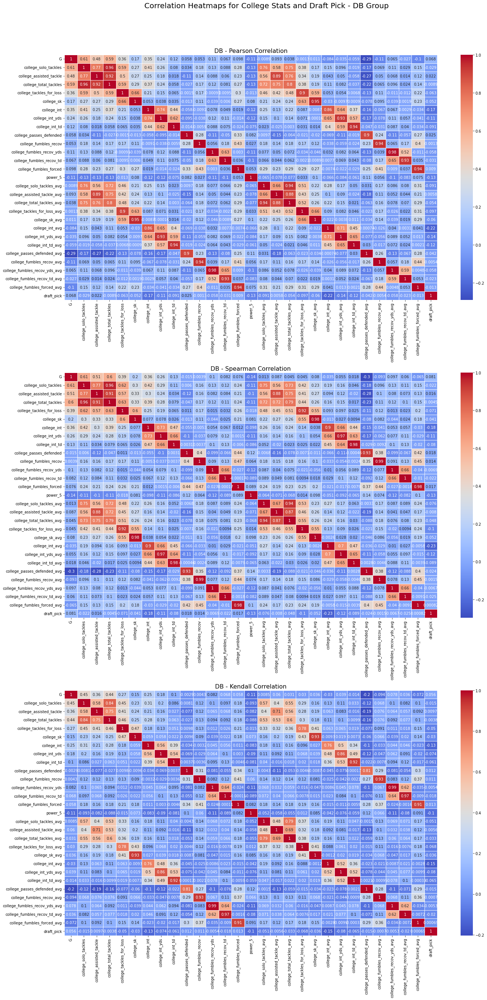

In [13]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Select relevant college stat features for correlation analysis with draft_pick
college_stat_columns_with_draft_pick = [
    'G', 'college_solo_tackles', 'college_assisted_tackle', 'college_total_tackles',
    'college_tackles_for_loss', 'college_sk', 'college_int', 'college_int_yds',
    'college_int_td', 'college_passes_defended', 'college_fumbles_recov', 
    'college_fumbles_recov_yds', 'college_fumbles_recov_td', 'college_fumbles_forced', 
    'power_5', 'college_solo_tackles_avg',
       'college_assisted_tackle_avg', 'college_total_tackles_avg',
       'college_tackles_for_loss_avg', 'college_sk_avg', 'college_int_avg',
       'college_int_yds_avg', 'college_int_td_avg',
       'college_passes_defended_avg', 'college_fumbles_recov_avg',
       'college_fumbles_recov_yds_avg', 'college_fumbles_recov_td_avg',
       'college_fumbles_forced_avg', 'draft_pick'  # Add draft_pick for correlation analysis
]

# Function to create heatmaps for all correlation methods for the DB position group
def plot_college_stats_correlation_db_methods():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    fig, axes = plt.subplots(3, 1, figsize=(20, 38))  # Create a 3x1 grid of subplots (one below the other)
    fig.suptitle('Correlation Heatmaps for College Stats and Draft Pick - DB Group', fontsize=20)
    
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == 'DB']
    
    for i, method in enumerate(methods):
        correlation_matrix = group_data[college_stat_columns_with_draft_pick].corr(method=method)
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=axes[i])
        axes[i].set_title(f'DB - {method.capitalize()} Correlation', fontsize=16)
        

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to plot all correlation methods for the DB position group
plot_college_stats_correlation_db_methods()

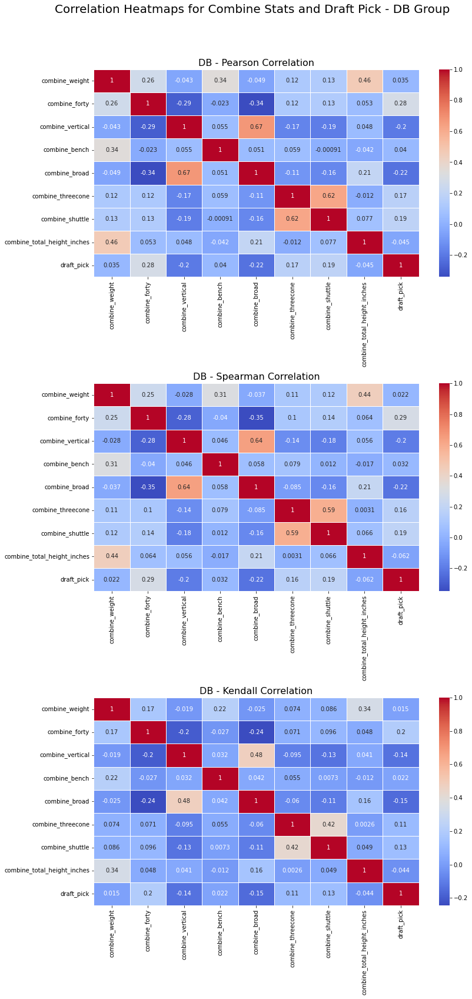

In [14]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Select relevant combine stat features for correlation analysis with draft_pick
combine_stat_columns_with_draft_pick = [
    'combine_weight', 'combine_forty', 'combine_vertical', 'combine_bench', 
    'combine_broad', 'combine_threecone', 'combine_shuttle', 'combine_total_height_inches', 
    'draft_pick'  # Add draft_pick for correlation analysis
]

# Function to create heatmaps for all correlation methods for the DB position group (combine stats)
def plot_combine_stats_correlation_db_methods():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    fig, axes = plt.subplots(3, 1, figsize=(12, 24))  # Create a 3x1 grid of subplots
    fig.suptitle('Correlation Heatmaps for Combine Stats and Draft Pick - DB Group', fontsize=20)
    
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == 'DB']
    
    for i, method in enumerate(methods):
        correlation_matrix = group_data[combine_stat_columns_with_draft_pick].corr(method=method)
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=axes[i])
        axes[i].set_title(f'DB - {method.capitalize()} Correlation', fontsize=16)
        

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to plot all correlation methods for the DB position group
plot_combine_stats_correlation_db_methods()


In [15]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure the folder exists for saving the heatmaps
if not os.path.exists('pic'):
    os.makedirs('pic')

# Function to create and save separate heatmaps for all correlation methods
def save_separate_college_stats_draftpick_correlation_heatmaps():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    position_groups = ['DL', 'LB', 'DB']  # Position groups to analyze
    
    for position in position_groups:
        group_data = complete_drafted_df[complete_drafted_df['position_group'] == position]
        
        for method in methods:
            # Compute the correlation matrix
            correlation_matrix = group_data[college_stat_columns_with_draft_pick].corr(method=method)
            
            # Create the heatmap
            plt.figure(figsize=(18, 12))
            sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
            plt.title(f'{position} - {method.capitalize()} Correlation with Draft Pick', fontsize=16)
            
            # Save the heatmap
            plt.savefig(f'pic/{position}_{method}_correlation_college_draftpick_heatmap.png', dpi=300, bbox_inches='tight')
            plt.close()  # Close the figure to avoid overlap in subsequent plots

# Call the function to save all heatmaps separately
save_separate_college_stats_draftpick_correlation_heatmaps()


In [16]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure the folder exists for saving the heatmaps
if not os.path.exists('pic'):
    os.makedirs('pic')

# Function to create and save separate heatmaps for all correlation methods
def save_separate_combine_draftpick_correlation_heatmaps():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    position_groups = ['DL', 'LB', 'DB']  # Position groups to analyze
    
    for position in position_groups:
        group_data = complete_drafted_df[complete_drafted_df['position_group'] == position]
        
        for method in methods:
            # Compute the correlation matrix
            correlation_matrix = group_data[combine_stat_columns_with_draft_pick].corr(method=method)
            
            # Create the heatmap
            plt.figure(figsize=(18, 12))
            sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
            plt.title(f'{position} - {method.capitalize()} Correlation with Draft Pick', fontsize=16)
            
            # Save the heatmap
            plt.savefig(f'pic/{position}_{method}_correlation_combine_draftpick_heatmap.png', dpi=300, bbox_inches='tight')
            plt.close()  # Close the figure to avoid overlap in subsequent plots

# Call the function to save all heatmaps separately
save_separate_combine_draftpick_correlation_heatmaps()


In [17]:
#######

In [18]:
###carav value

In [19]:
# Calculate the average draft_carav by player_year
avg_draft_carav_by_year = complete_drafted_df.groupby('player_year')['draft_carav'].mean()

# Display the result
print(avg_draft_carav_by_year)


player_year
2008.0    14.968421
2009.0    17.284314
2010.0    22.045455
2011.0    20.000000
2012.0    22.883495
2013.0    17.211538
2014.0    16.657407
2015.0    18.330000
2016.0    19.972477
2017.0    17.258621
2018.0    15.568807
2019.0    12.981818
2020.0     9.268908
2021.0     6.944882
2022.0     5.247788
2023.0     1.763158
2024.0     0.000000
Name: draft_carav, dtype: float64


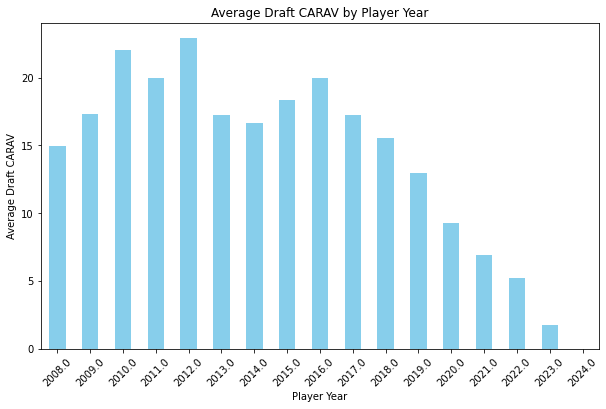

In [20]:
import matplotlib.pyplot as plt

# Plot the average draft_carav by player_year
plt.figure(figsize=(10, 6))
avg_draft_carav_by_year.plot(kind='bar', color='skyblue')
plt.title('Average Draft CARAV by Player Year')
plt.xlabel('Player Year')
plt.ylabel('Average Draft CARAV')
plt.xticks(rotation=45)
plt.show()


In [21]:
# Calculate the average draft_carav by player_year and position_group
avg_draft_carav_by_year_and_group = complete_drafted_df.groupby(['player_year', 'position_group'])['draft_carav'].mean()

# Display the result
print(avg_draft_carav_by_year_and_group)


player_year  position_group
2008.0       DB                15.756757
             DL                16.060606
             LB                12.360000
2009.0       DB                16.511111
             DL                17.967742
             LB                17.807692
2010.0       DB                19.279070
             DL                28.642857
             LB                15.720000
2011.0       DB                12.750000
             DL                29.405405
             LB                18.964286
2012.0       DB                15.823529
             DL                23.076923
             LB                30.633333
2013.0       DB                17.581395
             DL                16.675676
             LB                17.375000
2014.0       DB                11.851064
             DL                18.937500
             LB                21.931034
2015.0       DB                13.942857
             DL                22.388889
             LB              

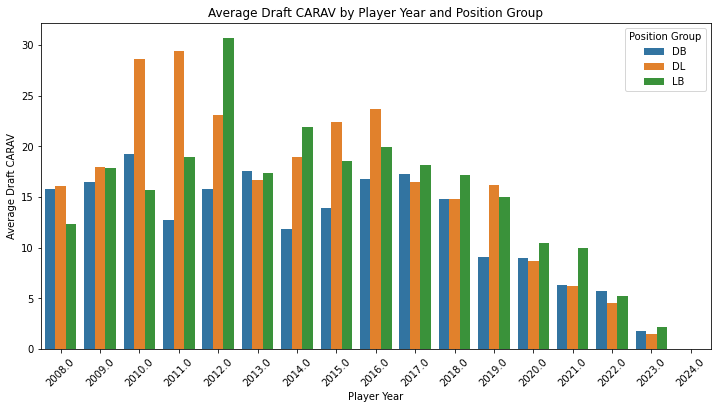

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Reset the index for easier plotting
avg_draft_carav_df = avg_draft_carav_by_year_and_group.reset_index()

# Plot the average draft_carav by player_year and position_group
plt.figure(figsize=(12, 6))
sns.barplot(x='player_year', y='draft_carav', hue='position_group', data=avg_draft_carav_df)
plt.title('Average Draft CARAV by Player Year and Position Group')
plt.xlabel('Player Year')
plt.ylabel('Average Draft CARAV')
plt.xticks(rotation=45)
plt.legend(title='Position Group')
plt.show()


In [23]:
###DL

In [6]:
# Ensure carav_per_year is calculated
complete_drafted_df['years_played'] = complete_drafted_df['draft_to'] - complete_drafted_df['player_year']
complete_drafted_df['years_played'] = complete_drafted_df['years_played'].replace(0, 1)  # Avoid division by zero
complete_drafted_df['carav_per_year'] = complete_drafted_df['draft_carav'] / complete_drafted_df['years_played']



,Statistic,Pearson Correlation,p-value,p-value < 0.05
0,college_total_tackles_avg,0.217621,0.0000,True
1,college_tackles_for_loss_avg,0.203675,0.0000,True
2,college_sk_avg,0.164522,0.0000,True
3,college_int_avg,0.093447,0.0204,True
4,college_int_yds_avg,0.045170,0.2630,False
5,college_int_td_avg,-0.133780,0.0009,True
6,college_passes_defended_avg,0.121575,0.0025,True
7,college_fumbles_recov_avg,0.029903,0.4588,False
8,college_fumbles_recov_yds_avg,0.098851,0.0141,True
9,college_fumbles_recov_td_avg,0.034707,0.3898,False


,Statistic,Pearson Correlation,p-value
0,G,-0.084316,3.642496e-02
1,college_solo_tackles,0.090324,2.497291e-02
2,college_assisted_tackle,0.069108,8.657011e-02
3,college_total_tackles,0.091305,2.343602e-02
4,college_tackles_for_loss,0.140424,4.732051e-04
5,college_sk,0.114073,4.586559e-03
6,college_int,0.063858,1.133523e-01
7,college_int_yds,0.030528,4.494526e-01
8,college_int_td,-0.127563,1.511007e-03
9,college_passes_defended,0.132132,1.011881e-03


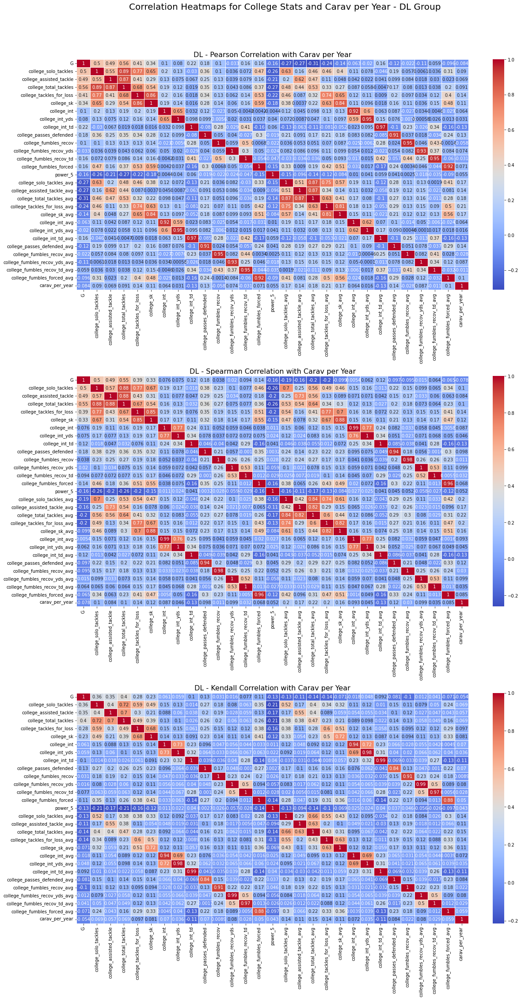

In [25]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Select relevant college stat features for correlation analysis with carav_per_year
college_stat_columns_with_carav_per_year = [
    'G', 'college_solo_tackles', 'college_assisted_tackle', 'college_total_tackles',
    'college_tackles_for_loss', 'college_sk', 'college_int', 'college_int_yds',
    'college_int_td', 'college_passes_defended', 'college_fumbles_recov', 
    'college_fumbles_recov_yds', 'college_fumbles_recov_td', 'college_fumbles_forced', 
    'power_5', 'college_solo_tackles_avg', 'college_assisted_tackle_avg', 
    'college_total_tackles_avg', 'college_tackles_for_loss_avg', 'college_sk_avg', 
    'college_int_avg', 'college_int_yds_avg', 'college_int_td_avg',
    'college_passes_defended_avg', 'college_fumbles_recov_avg', 
    'college_fumbles_recov_yds_avg', 'college_fumbles_recov_td_avg', 
    'college_fumbles_forced_avg', 'carav_per_year'  # Add carav_per_year for correlation analysis
]

# Function to create heatmaps for all correlation methods for the DL position group
def plot_college_stats_correlation_dl_methods_carav_per_year():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    fig, axes = plt.subplots(3, 1, figsize=(18, 32))  # Create a 3x1 grid of subplots
    fig.suptitle('Correlation Heatmaps for College Stats and Carav per Year - DL Group', fontsize=20)
    
    # Filter data for the DL position group
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == 'DL']
    
    for i, method in enumerate(methods):
        # Compute the correlation matrix
        correlation_matrix = group_data[college_stat_columns_with_carav_per_year].corr(method=method)
        
        # Plot the heatmap
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=axes[i])
        axes[i].set_title(f'DL - {method.capitalize()} Correlation with Carav per Year', fontsize=16)
        

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to plot correlation methods for DL position group
plot_college_stats_correlation_dl_methods_carav_per_year()


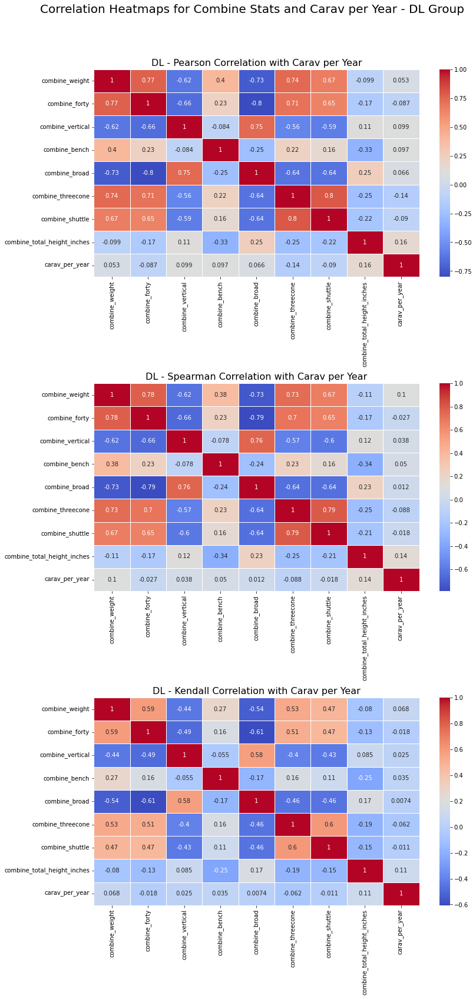

In [26]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns


# Select relevant combine stat features for correlation analysis with carav_per_year
combine_stat_columns_with_carav_per_year = [
    'combine_weight', 'combine_forty', 'combine_vertical', 'combine_bench', 
    'combine_broad', 'combine_threecone', 'combine_shuttle', 'combine_total_height_inches', 
    'carav_per_year'  # Use carav_per_year for correlation analysis
]

# Function to create heatmaps for all correlation methods for the DL position group (combine stats)
def plot_combine_stats_correlation_dl_methods_carav_per_year():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    fig, axes = plt.subplots(3, 1, figsize=(12, 24))  # Create a 3x1 grid of subplots
    fig.suptitle('Correlation Heatmaps for Combine Stats and Carav per Year - DL Group', fontsize=20)
    
    # Filter data for the DL position group
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == 'DL']
    
    for i, method in enumerate(methods):
        # Compute the correlation matrix
        correlation_matrix = group_data[combine_stat_columns_with_carav_per_year].corr(method=method)
        
        # Plot the heatmap
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=axes[i])
        axes[i].set_title(f'DL - {method.capitalize()} Correlation with Carav per Year', fontsize=16)
        

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to plot correlation methods for DL position group (combine stats)
plot_combine_stats_correlation_dl_methods_carav_per_year()


In [27]:
#lb

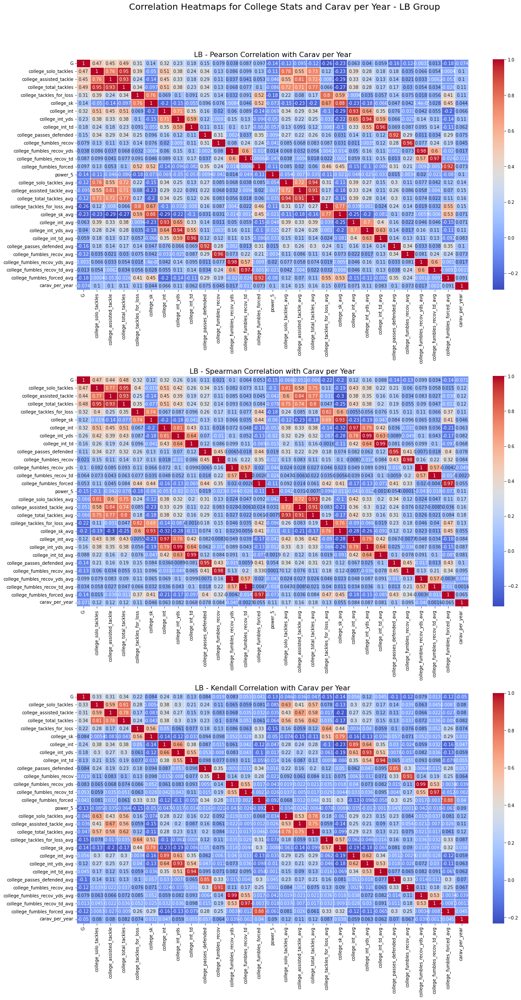

In [28]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns


# Select relevant college stat features for correlation analysis with carav_per_year
college_stat_columns_with_carav_per_year = [
    'G', 'college_solo_tackles', 'college_assisted_tackle', 'college_total_tackles',
    'college_tackles_for_loss', 'college_sk', 'college_int', 'college_int_yds',
    'college_int_td', 'college_passes_defended', 'college_fumbles_recov', 
    'college_fumbles_recov_yds', 'college_fumbles_recov_td', 'college_fumbles_forced', 
    'power_5', 'college_solo_tackles_avg', 'college_assisted_tackle_avg', 
    'college_total_tackles_avg', 'college_tackles_for_loss_avg', 'college_sk_avg', 
    'college_int_avg', 'college_int_yds_avg', 'college_int_td_avg',
    'college_passes_defended_avg', 'college_fumbles_recov_avg', 
    'college_fumbles_recov_yds_avg', 'college_fumbles_recov_td_avg', 
    'college_fumbles_forced_avg', 'carav_per_year'  # Add carav_per_year for correlation analysis
]

# Function to create heatmaps for all correlation methods for the LB position group
def plot_college_stats_correlation_lb_methods_carav_per_year():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    fig, axes = plt.subplots(3, 1, figsize=(18, 32))  # Create a 3x1 grid of subplots (one below the other)
    fig.suptitle('Correlation Heatmaps for College Stats and Carav per Year - LB Group', fontsize=20)
    
    # Filter data for the LB position group
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == 'LB']
    
    for i, method in enumerate(methods):
        # Compute the correlation matrix
        correlation_matrix = group_data[college_stat_columns_with_carav_per_year].corr(method=method)
        
        # Plot the heatmap
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=axes[i])
        axes[i].set_title(f'LB - {method.capitalize()} Correlation with Carav per Year', fontsize=16)
        

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to plot correlation methods for the LB position group
plot_college_stats_correlation_lb_methods_carav_per_year()


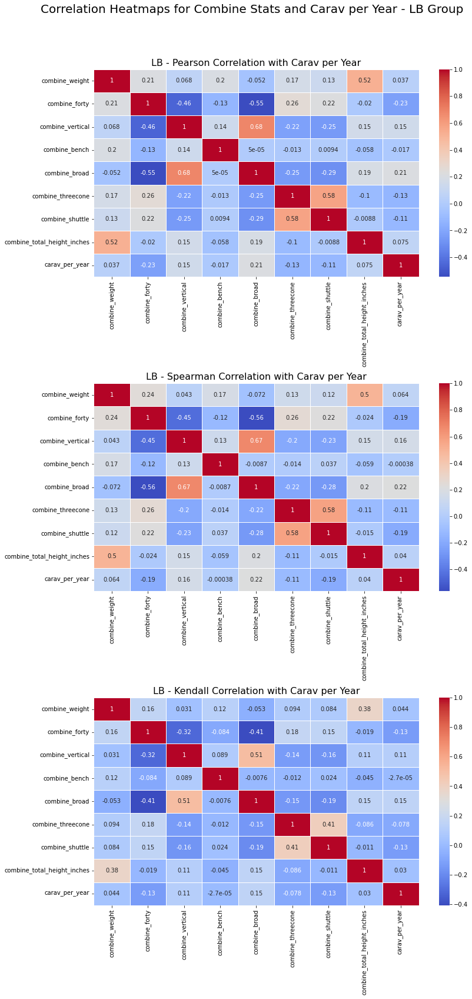

In [29]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Select relevant combine stat features for correlation analysis with carav_per_year
combine_stat_columns_with_carav_per_year = [
    'combine_weight', 'combine_forty', 'combine_vertical', 'combine_bench', 
    'combine_broad', 'combine_threecone', 'combine_shuttle', 'combine_total_height_inches', 
    'carav_per_year'  # Use carav_per_year for correlation analysis
]

# Function to create heatmaps for all correlation methods for the LB position group (combine stats)
def plot_combine_stats_correlation_lb_methods_carav_per_year():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    fig, axes = plt.subplots(3, 1, figsize=(12, 24))  # Create a 3x1 grid of subplots
    fig.suptitle('Correlation Heatmaps for Combine Stats and Carav per Year - LB Group', fontsize=20)
    
    # Filter data for the LB position group
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == 'LB']
    
    for i, method in enumerate(methods):
        # Compute the correlation matrix
        correlation_matrix = group_data[combine_stat_columns_with_carav_per_year].corr(method=method)
        
        # Plot the heatmap
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=axes[i])
        axes[i].set_title(f'LB - {method.capitalize()} Correlation with Carav per Year', fontsize=16)
        

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to plot correlation methods for LB position group (combine stats)
plot_combine_stats_correlation_lb_methods_carav_per_year()


In [30]:
#db

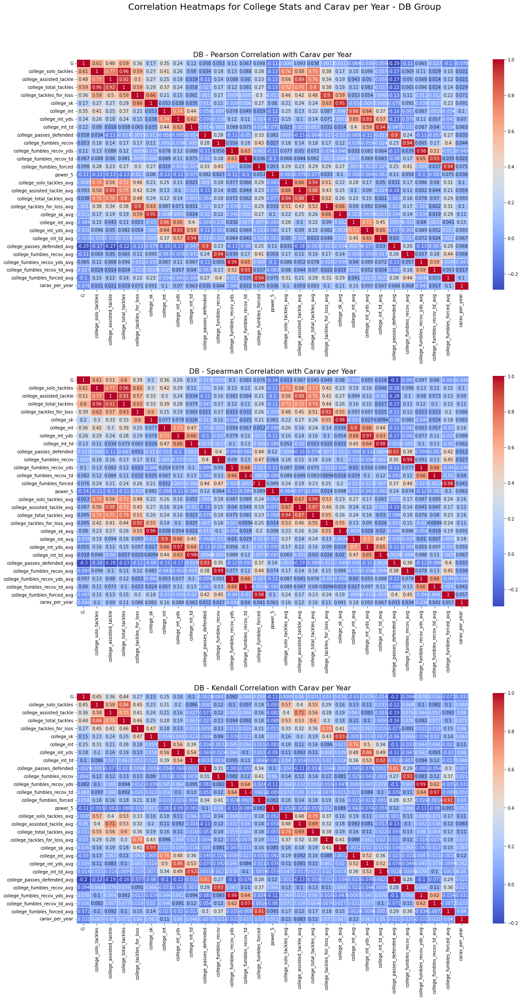

In [31]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Define the columns for correlation analysis, including carav_per_year
college_stat_columns_with_carav_per_year = [
    'G', 'college_solo_tackles', 'college_assisted_tackle', 'college_total_tackles',
    'college_tackles_for_loss', 'college_sk', 'college_int', 'college_int_yds',
    'college_int_td', 'college_passes_defended', 'college_fumbles_recov', 
    'college_fumbles_recov_yds', 'college_fumbles_recov_td', 'college_fumbles_forced', 
    'power_5', 'college_solo_tackles_avg', 'college_assisted_tackle_avg', 
    'college_total_tackles_avg', 'college_tackles_for_loss_avg', 'college_sk_avg', 
    'college_int_avg', 'college_int_yds_avg', 'college_int_td_avg',
    'college_passes_defended_avg', 'college_fumbles_recov_avg', 
    'college_fumbles_recov_yds_avg', 'college_fumbles_recov_td_avg', 
    'college_fumbles_forced_avg', 'carav_per_year'  # Include carav_per_year
]

# Function to plot correlation heatmaps for DB position group
def plot_college_stats_correlation_db_methods_carav_per_year():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    fig, axes = plt.subplots(3, 1, figsize=(18, 32))  # Create a 3x1 grid of subplots
    fig.suptitle('Correlation Heatmaps for College Stats and Carav per Year - DB Group', fontsize=20)
    
    # Filter data for the DB position group
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == 'DB']
    
    for i, method in enumerate(methods):
        # Compute the correlation matrix
        correlation_matrix = group_data[college_stat_columns_with_carav_per_year].corr(method=method)
        
        # Plot the heatmap
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=axes[i])
        axes[i].set_title(f'DB - {method.capitalize()} Correlation with Carav per Year', fontsize=16)
        

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to plot correlation methods for DB position group
plot_college_stats_correlation_db_methods_carav_per_year()


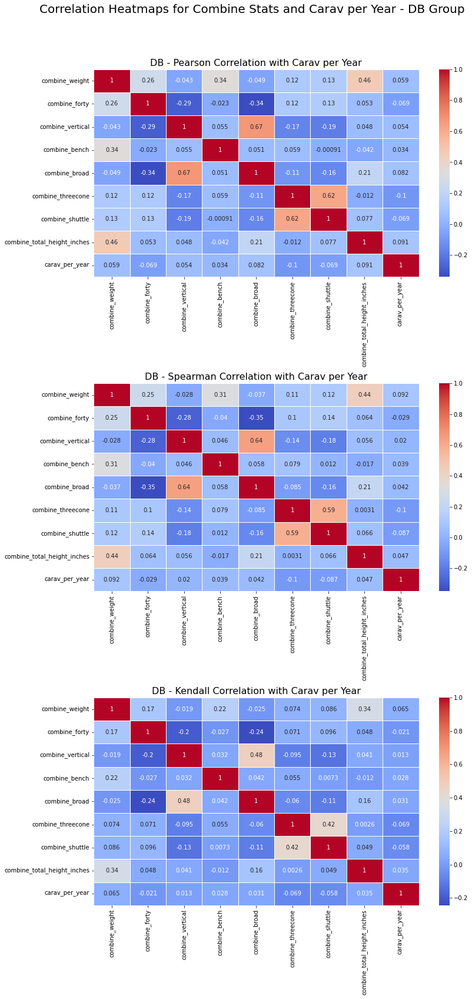

In [32]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns


# Select relevant combine stat features for correlation analysis with carav_per_year
combine_stat_columns_with_carav_per_year = [
    'combine_weight', 'combine_forty', 'combine_vertical', 'combine_bench', 
    'combine_broad', 'combine_threecone', 'combine_shuttle', 'combine_total_height_inches', 
    'carav_per_year'  # Use carav_per_year for correlation analysis
]

# Function to create heatmaps for all correlation methods for the DB position group (combine stats)
def plot_combine_stats_correlation_db_methods_carav_per_year():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    fig, axes = plt.subplots(3, 1, figsize=(12, 24))  # Create a 3x1 grid of subplots
    fig.suptitle('Correlation Heatmaps for Combine Stats and Carav per Year - DB Group', fontsize=20)
    
    # Filter data for the DB position group
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == 'DB']
    
    for i, method in enumerate(methods):
        # Compute the correlation matrix
        correlation_matrix = group_data[combine_stat_columns_with_carav_per_year].corr(method=method)
        
        # Plot the heatmap
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=axes[i])
        axes[i].set_title(f'DB - {method.capitalize()} Correlation with Carav per Year', fontsize=16)
        

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
    plt.show()

# Call the function to plot correlation methods for DB position group (combine stats)
plot_combine_stats_correlation_db_methods_carav_per_year()


In [33]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure the folder exists for saving the heatmaps
if not os.path.exists('pic'):
    os.makedirs('pic')

# Function to create and save separate heatmaps for all correlation methods
def save_separate_college_stats_carav_correlation_heatmaps():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    position_groups = ['DL', 'LB', 'DB']  # Position groups to analyze
    
    for position in position_groups:
        group_data = complete_drafted_df[complete_drafted_df['position_group'] == position]
        
        for method in methods:
            # Compute the correlation matrix
            correlation_matrix = group_data[college_stat_columns_with_carav_per_year].corr(method=method)
            
            # Create the heatmap
            plt.figure(figsize=(18, 12))
            sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
            plt.title(f'{position} - {method.capitalize()} Correlation with CarAv per year', fontsize=16)
            
            # Save the heatmap
            plt.savefig(f'pic/{position}_{method}_correlation_college_carav_heatmap.png', dpi=300, bbox_inches='tight')
            plt.close()  # Close the figure to avoid overlap in subsequent plots

# Call the function to save all heatmaps separately
save_separate_college_stats_carav_correlation_heatmaps()


In [34]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure the folder exists for saving the heatmaps
if not os.path.exists('pic'):
    os.makedirs('pic')

# Function to create and save separate heatmaps for all correlation methods
def save_separate_combine_carav_correlation_heatmaps():
    methods = ['pearson', 'spearman', 'kendall']  # Correlation methods
    position_groups = ['DL', 'LB', 'DB']  # Position groups to analyze
    
    for position in position_groups:
        group_data = complete_drafted_df[complete_drafted_df['position_group'] == position]
        
        for method in methods:
            # Compute the correlation matrix
            correlation_matrix = group_data[combine_stat_columns_with_carav_per_year].corr(method=method)
            
            # Create the heatmap
            plt.figure(figsize=(18, 12))
            sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
            plt.title(f'{position} - {method.capitalize()} Correlation with CarAV per year', fontsize=16)
            
            # Save the heatmap
            plt.savefig(f'pic/{position}_{method}_correlation_combine_carav_heatmap.png', dpi=300, bbox_inches='tight')
            plt.close()  # Close the figure to avoid overlap in subsequent plots

# Call the function to save all heatmaps separately
save_separate_combine_carav_correlation_heatmaps()


In [40]:
import pandas as pd

# Initialize dictionaries to store significant correlations for each position group
significant_correlations = {
    'DL': set(),
    'LB': set(),
    'DB': set()
}

# Define correlation methods and position groups
methods = ['pearson', 'spearman', 'kendall']
position_groups = ['DL', 'LB', 'DB']

# Function to get significant correlations for each group and stat type
def get_significant_correlations_any_method(position_group, columns, stat_type):
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == position_group]
    
    for method in methods:
        # Compute correlation matrix
        correlation_matrix = group_data[columns].corr(method=method)
        
        # Filter correlations with draft_pick > 0.15
        high_corr = correlation_matrix['draft_pick'][abs(correlation_matrix['draft_pick']) > 0.15].drop('draft_pick')
        
        # Add features with high correlation to the set for the position group
        if not high_corr.empty:
            significant_correlations[position_group].update(high_corr.index)

# Columns for each stat type
college_stat_columns_with_draft_pick = [
    'G', 'college_solo_tackles', 'college_assisted_tackle', 'college_total_tackles',
    'college_tackles_for_loss', 'college_sk', 'college_int', 'college_int_yds',
    'college_int_td', 'college_passes_defended', 'college_fumbles_recov', 
    'college_fumbles_recov_yds', 'college_fumbles_recov_td', 'college_fumbles_forced', 
    'power_5', 'college_solo_tackles_avg', 'college_assisted_tackle_avg', 'college_total_tackles_avg',
    'college_tackles_for_loss_avg', 'college_sk_avg', 'college_int_avg',
    'college_int_yds_avg', 'college_int_td_avg', 'college_passes_defended_avg', 
    'college_fumbles_recov_avg', 'college_fumbles_recov_yds_avg', 'college_fumbles_recov_td_avg',
    'college_fumbles_forced_avg', 'draft_pick'
]

combine_stat_columns_with_draft_pick = [
    'combine_weight', 'combine_forty', 'combine_vertical', 'combine_bench', 
    'combine_broad', 'combine_threecone', 'combine_shuttle', 'combine_total_height_inches', 
    'draft_pick'
]

# Gather correlations for each position group and stat type
for position_group in position_groups:
    get_significant_correlations_any_method(position_group, college_stat_columns_with_draft_pick, 'college_stats')
    get_significant_correlations_any_method(position_group, combine_stat_columns_with_draft_pick, 'combine_stats')

# Display the significant correlations for each position group
for position_group, features in significant_correlations.items():
    print(f"\nSignificant Correlations for {position_group} Position Group (any method):")
    print(sorted(features))



Significant Correlations for DL Position Group (any method):
['college_sk', 'college_sk_avg', 'college_solo_tackles_avg', 'college_tackles_for_loss', 'college_tackles_for_loss_avg', 'college_total_tackles_avg', 'combine_forty']

Significant Correlations for LB Position Group (any method):
['college_sk', 'college_sk_avg', 'college_tackles_for_loss', 'college_tackles_for_loss_avg', 'combine_broad', 'combine_forty', 'combine_total_height_inches', 'combine_vertical', 'combine_weight']

Significant Correlations for DB Position Group (any method):
['college_int', 'college_int_avg', 'combine_broad', 'combine_forty', 'combine_shuttle', 'combine_threecone', 'combine_vertical']


In [41]:
import pandas as pd

# Initialize dictionaries to store significant correlations for each position group
significant_correlations_carav = {
    'DL': set(),
    'LB': set(),
    'DB': set()
}

# Define correlation methods and position groups
methods = ['pearson', 'spearman', 'kendall']
position_groups = ['DL', 'LB', 'DB']


# Function to get significant correlations for each group and stat type
def get_significant_correlations_any_method(position_group, columns, stat_type):
    group_data = complete_drafted_df[complete_drafted_df['position_group'] == position_group]
    
    for method in methods:
        # Compute correlation matrix
        correlation_matrix = group_data[columns].corr(method=method)
        
        # Filter correlations with carav_per_year > 0.15
        high_corr = correlation_matrix['carav_per_year'][abs(correlation_matrix['carav_per_year']) > 0.15].drop('carav_per_year')
        
        # Add features with high correlation to the set for the position group
        if not high_corr.empty:
            significant_correlations_carav[position_group].update(high_corr.index)

# Columns for each stat type with 'carav_per_year'
college_stat_columns_with_carav_per_year = [
    'G', 'college_solo_tackles', 'college_assisted_tackle', 'college_total_tackles',
    'college_tackles_for_loss', 'college_sk', 'college_int', 'college_int_yds',
    'college_int_td', 'college_passes_defended', 'college_fumbles_recov', 
    'college_fumbles_recov_yds', 'college_fumbles_recov_td', 'college_fumbles_forced', 
    'power_5', 'college_solo_tackles_avg', 'college_assisted_tackle_avg', 'college_total_tackles_avg',
    'college_tackles_for_loss_avg', 'college_sk_avg', 'college_int_avg',
    'college_int_yds_avg', 'college_int_td_avg', 'college_passes_defended_avg', 
    'college_fumbles_recov_avg', 'college_fumbles_recov_yds_avg', 'college_fumbles_recov_td_avg',
    'college_fumbles_forced_avg', 'carav_per_year'
]

combine_stat_columns_with_carav_per_year = [
    'combine_weight', 'combine_forty', 'combine_vertical', 'combine_bench', 
    'combine_broad', 'combine_threecone', 'combine_shuttle', 'combine_total_height_inches', 
    'carav_per_year'
]

# Gather correlations for each position group and stat type
for position_group in position_groups:
    get_significant_correlations_any_method(position_group, college_stat_columns_with_carav_per_year, 'college_stats')
    get_significant_correlations_any_method(position_group, combine_stat_columns_with_carav_per_year, 'combine_stats')

# Display the significant correlations for each position group
for position_group, features in significant_correlations_carav.items():
    print(f"\nSignificant Correlations for {position_group} Position Group with Carav per Year (any method):")
    print(sorted(features))



Significant Correlations for DL Position Group with Carav per Year (any method):
['college_assisted_tackle_avg', 'college_sk_avg', 'college_solo_tackles_avg', 'college_tackles_for_loss_avg', 'college_total_tackles_avg', 'combine_total_height_inches']

Significant Correlations for LB Position Group with Carav per Year (any method):
['college_assisted_tackle_avg', 'college_solo_tackles_avg', 'college_total_tackles_avg', 'combine_broad', 'combine_forty', 'combine_shuttle', 'combine_vertical']

Significant Correlations for DB Position Group with Carav per Year (any method):
['college_int', 'college_int_avg', 'college_solo_tackles_avg', 'college_total_tackles_avg']
